<a href="https://colab.research.google.com/github/wenshanliu-slu0/HDS5960-Capstone/blob/main/Drug_notebook_data_check_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Data Info

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('/content/Accidental_Drug_Related_Deaths_2012-2024.csv')

In [ ]:
df.shape

(12963, 48)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12963 entries, 0 to 12962
Data columns (total 48 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Date                           12963 non-null  object 
 1   Date Type                      12963 non-null  object 
 2   Age                            12961 non-null  float64
 3   Sex                            12954 non-null  object 
 4   Race                           12897 non-null  object 
 5   Ethnicity                      3435 non-null   object 
 6   Residence City                 12320 non-null  object 
 7   Residence County               11655 non-null  object 
 8   Residence State                10927 non-null  object 
 9   Injury City                    12706 non-null  object 
 10  Injury County                  9527 non-null   object 
 11  Injury State                   9849 non-null   object 
 12  Injury Place                   12573 non-null 

In [ ]:
# Annoying with / (slash) in coulmn, so rename the column first
df = df.rename(columns={'Meth/Amphetamine': 'Meth_Amphetamine'})

In [ ]:
df

,Date,Date Type,Age,Sex,Race,Ethnicity,Residence City,Residence County,Residence State,Injury City,...,Xylazine,Gabapentin,Opiate NOS,Heroin/Morph/Codeine,Other Opioid,Any Opioid,Other,ResidenceCityGeo,InjuryCityGeo,DeathCityGeo
0,01/02/2023,Date of death,65.0,Male,White,"No, not Spanish/Hispanic/Latino",BRIDGEPORT,FAIRFIELD,CT,BRIDGEPORT,...,NaN,NaN,NaN,NaN,NaN,Y,NaN,"BRIDGEPORT, CT\n(41.179195, -73.189476)","BRIDGEPORT, CT\n(41.179195, -73.189476)","CT\n(41.57350273, -72.738305908)"
1,01/18/2023,Date of death,42.0,Male,White,"No, not Spanish/Hispanic/Latino",WATERBURY,NEW HAVEN,CT,FARMINGTON,...,NaN,NaN,NaN,NaN,NaN,Y,NaN,"WATERBURY, CT\n(41.5542609, -73.0430692)","FARMINGTON, CT\n(41.726536, -72.8250564)","CT\n(41.57350273, -72.738305908)"
2,01/26/2022,Date of death,34.0,Male,White,NaN,BROOKFIELD,FAIRFIELD,CT,BROOKFIELD,...,Y,NaN,NaN,Y,NaN,Y,NaN,"BROOKFIELD, CT\n(41.46736000000004, -73.398259...","BROOKFIELD, CT\n(41.46736000000004, -73.398259...","CT\n(41.57350273000003, -72.73830590799997)"
3,02/04/2023,Date of death,34.0,Male,White,NaN,NaN,NaN,NaN,NEW HAVEN,...,NaN,NaN,NaN,NaN,NaN,Y,NaN,"CT\n(41.57350273, -72.738305908)","NEW HAVEN, CT\n(41.3082517, -72.9241605)","CT\n(41.57350273, -72.738305908)"
4,02/18/2022,Date of death,43.0,Male,White,NaN,NORWICH,NEW LONDON,CT,NORWICH,...,NaN,NaN,NaN,NaN,NaN,Y,NaN,"NORWICH, CT\n(41.526760000000024, -72.07567999...","NORWICH, CT\n(41.526760000000024, -72.07567999...","CT\n(41.57350273000003, -72.73830590799997)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12958,09/01/2024,Date of death,48.0,Male,Black or African American,"No, not Spanish/Hispanic/Latino",WATERBURY,NEW HAVEN,CT,WATERBURY,...,Y,NaN,NaN,NaN,NaN,Y,NaN,"WATERBURY, CT\n(41.5549, -73.04647)","WATERBURY, CT\n(41.5549, -73.04647)","CT\n(41.76381, -72.67398)"
12959,03/14/2024,Date of death,53.0,Male,White,"Yes, other Spanish/Hispanic/Latino",HARTFORD,HARTFORD,CT,HARTFORD,...,Y,NaN,NaN,NaN,NaN,Y,NaN,"HARTFORD, CT\n(41.76381, -72.67397)","HARTFORD, CT\n(41.76381, -72.67397)","CT\n(41.76381, -72.67398)"
12960,11/21/2024,Date of death,31.0,Male,White,"No, not Spanish/Hispanic/Latino",KILLINGWORTH,MIDDLESEX,CT,KILLINGWORTH,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"KILLINGWORTH, CT\n(41.35961, -72.56592)","KILLINGWORTH, CT\n(41.35961, -72.56592)","CT\n(41.76381, -72.67398)"
12961,02/01/2024,Date of death,66.0,Male,White,"No, not Spanish/Hispanic/Latino",DAYVILLE,WINDHAM,CT,DAYVILLE,...,Y,Y,NaN,NaN,NaN,Y,NaN,"DAYVILLE, CT\n(41.84559, -71.88653)","DAYVILLE, CT\n(41.84559, -71.88653)","CT\n(41.76381, -72.67398)"


In [ ]:
# install packages (purpose: exploratory data analysis)
!pip install ydata-profiling


In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Profiling Report", explorative=True)
profile.to_notebook_iframe()  # show in Jupyter Notebook


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 48/48 [00:07<00:00,  6.81it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### **Code Method to do EDA:**

In [ ]:
'''
# Filter the DataFrame to include only rows where 'Any Opioid' is 'Y'
opioid_involved_df = df[df['Any Opioid'] == 'Y']

# count the rows of opioid_involved_df
num_rows = opioid_involved_df.shape[0]

print(f"Number of rows where 'Any Opioid' is 'Y': {num_rows}")

#----------------
# Filter the DataFrame to include only rows where 'Any Opioid' is 'N'
no_opioid_involved_df = df[df['Any Opioid'] == 'N']

# count the rows of opioid_involved_df
num_rows = no_opioid_involved_df.shape[0]

print(f"Number of rows where 'Any Opioid' is 'N': {num_rows}")


#----------------
# Filter the DataFrame to include only rows where 'Any Opioid' is Null
Null_opioid_involved_df = df[df['Any Opioid'].isna()]

# count the rows of opioid_involved_df
num_rows = Null_opioid_involved_df.shape[0]

print(f"Number of rows where 'Any Opioid' is 'Null': {num_rows}")

'''

'\n# Filter the DataFrame to include only rows where \'Any Opioid\' is \'Y\'\nopioid_involved_df = df[df[\'Any Opioid\'] == \'Y\']\n\n# count the rows of opioid_involved_df\nnum_rows = opioid_involved_df.shape[0]\n\nprint(f"Number of rows where \'Any Opioid\' is \'Y\': {num_rows}")\n\n#----------------\n# Filter the DataFrame to include only rows where \'Any Opioid\' is \'N\'\nno_opioid_involved_df = df[df[\'Any Opioid\'] == \'N\']\n\n# count the rows of opioid_involved_df\nnum_rows = no_opioid_involved_df.shape[0]\n\nprint(f"Number of rows where \'Any Opioid\' is \'N\': {num_rows}")\n\n\n#----------------\n# Filter the DataFrame to include only rows where \'Any Opioid\' is Null\nNull_opioid_involved_df = df[df[\'Any Opioid\'].isna()]\n\n# count the rows of opioid_involved_df\nnum_rows = Null_opioid_involved_df.shape[0]\n\nprint(f"Number of rows where \'Any Opioid\' is \'Null\': {num_rows}")\n\n'

#### **Clean Data**
1. check Any Opioid column: Go through other opioid columns and determine y/n for missing data in 'Any Opioid'

2. Implement missing data

- According to the above report, there are some missing value in 'Cocaine', 'Ethanol', 'Amphet', 'Benzodiazepine', just implement data for N

In [ ]:
## To check Any Opioid data (if any opidid is Y, the missing value of Any_Opidid should be filled in 'Y')

# implement AnyOpioid function: to decide if AnyOpioid is T or False
opioid_cols = [
    'Heroin',
    'Fentanyl',
    'Fentanyl Analogue',
    'Oxycodone',
    'Oxymorphone',
    'Hydrocodone',
    'Methadone',
    'Tramad',
    'Morphine (Not Heroin)',
    'Hydromorphone',
    'Opiate NOS'

]


def check_any_opioid(row):
    return 'Y' if any(row[col] == 'Y' for col in opioid_cols) else 'N'


# Applied the function
# Only update nan data
df.loc[df['Any Opioid'].isna(), 'Any Opioid'] = df.loc[df['Any Opioid'].isna()].apply(check_any_opioid, axis=1)



In [ ]:
# implement opioid_cols
df[opioid_cols] = df[opioid_cols].fillna('N')
df[opioid_cols]

,Heroin,Fentanyl,Fentanyl Analogue,Oxycodone,Oxymorphone,Hydrocodone,Methadone,Tramad,Morphine (Not Heroin),Hydromorphone,Opiate NOS
0,N,Y,N,N,N,N,N,N,N,N,N
1,N,Y,N,N,N,N,N,N,N,N,N
2,Y,Y,N,N,N,N,N,N,N,N,N
3,N,Y,N,N,N,N,N,N,N,N,N
4,N,Y,N,N,N,N,N,N,N,N,N
...,...,...,...,...,...,...,...,...,...,...,...
12958,N,Y,N,Y,N,N,N,N,N,N,N
12959,N,Y,N,N,N,N,Y,N,N,N,N
12960,N,N,N,N,N,N,N,N,N,N,N
12961,N,Y,N,N,N,N,Y,N,N,N,N


In [ ]:
# 先不filter_clean dataset
'''
#df_clean = df[['Any Opioid', 'Cocaine', 'Ethanol', 'Amphet', 'Benzodiazepine', 'Age','Sex', 'Race', 'Date', 'Death County']]
df_clean = df[['Any Opioid', 'Cocaine', 'Ethanol', 'Amphet', 'Benzodiazepine', 'Age','Sex', 'Race','Ethnicity', 'Date', 'Death County',
    'Heroin',
    'Fentanyl',
    'Fentanyl Analogue',
    'Oxycodone',
    'Oxymorphone',
    'Hydrocodone',
    'Methadone',
    'Tramad',
    'Morphine (Not Heroin)',
    'Hydromorphone',
    'Opiate NOS' ,
    'Other Opioid',
    'Xylazine',
    'Gabapentin']]
df_clean.shape
'''


"\n#df_clean = df[['Any Opioid', 'Cocaine', 'Ethanol', 'Amphet', 'Benzodiazepine', 'Age','Sex', 'Race', 'Date', 'Death County']]\ndf_clean = df[['Any Opioid', 'Cocaine', 'Ethanol', 'Amphet', 'Benzodiazepine', 'Age','Sex', 'Race','Ethnicity', 'Date', 'Death County',\n    'Heroin',\n    'Fentanyl',\n    'Fentanyl Analogue',\n    'Oxycodone',\n    'Oxymorphone',\n    'Hydrocodone',\n    'Methadone',\n    'Tramad',\n    'Morphine (Not Heroin)',\n    'Hydromorphone',\n    'Opiate NOS' ,\n    'Other Opioid',\n    'Xylazine',\n    'Gabapentin']]\ndf_clean.shape\n"

In [ ]:
df = df[['Any Opioid', 'Cocaine', 'Ethanol', 'Amphet', 'Benzodiazepine','Meth_Amphetamine', 'Xylazine','Gabapentin', 'Age','Sex', 'Race','Ethnicity', 'Date', 'Death County',
   #'Heroin',
   # 'Fentanyl',
   # 'Fentanyl Analogue',
    #'Oxycodone',
   # 'Oxymorphone',
   # 'Hydrocodone',
   # 'Methadone',
   # 'Tramad',
   # 'Morphine (Not Heroin)',
   #'Hydromorphone',
   # 'Opiate NOS' ,
    'Other Opioid',
    'Manner of Death']]
    #'Xylazine',
    #'Gabapentin']]

In [ ]:
# to fill NA data as 'N' for non-Opioid

non_opidid_cols = ['Cocaine', 'Ethanol', 'Amphet','Benzodiazepine' ,'Meth_Amphetamine' ,'Xylazine' , 'Gabapentin']

# True / missing
df['Cocaine'] = df['Cocaine'].fillna('N')

# True/ missing / P
df['Ethanol'] = df['Ethanol'].fillna('N')
df['Ethanol']  = df['Ethanol'].replace('P', 'Ture')


# True/ Missing
df['Amphet'] = df['Amphet'].fillna('N')

# True/ Missing
df['Benzodiazepine'] = df['Benzodiazepine'].fillna('N')
# True/ Missing
df['Meth_Amphetamine'] = df['Meth_Amphetamine'].fillna('N')
# True/ Missing
df['Xylazine'] = df['Xylazine'].fillna('N')
# True/ Missing
df['Gabapentin'] = df['Gabapentin'].fillna('N')



<ipython-input-14-1942205450>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Cocaine'] = df['Cocaine'].fillna('N')
<ipython-input-14-1942205450>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Ethanol'] = df['Ethanol'].fillna('N')
<ipython-input-14-1942205450>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

In [ ]:
# Manner of Death column has several same meaning value
df['Manner of Death'].unique()

# replace all kind of accident --> Accident
df['Manner of Death'] = df['Manner of Death'].replace({
    'accident': 'Accident',
    'acciddent': 'Accident',
    'ACCIDENT' : 'Accident',
    'Acciddent': 'Accident'

})
df['Manner of Death'].unique()

<ipython-input-15-3632347191>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Manner of Death'] = df['Manner of Death'].replace({


array(['Accident', 'Pending', nan, 'Natural'], dtype=object)

In [ ]:
#see the pecentage of null
'''
# Calculate the percentage of null values for each column
percentage_of_null = df_clean.isnull().sum() / len(df_clean) * 100
percentage_of_null
'''

'\n# Calculate the percentage of null values for each column\npercentage_of_null = df_clean.isnull().sum() / len(df_clean) * 100\npercentage_of_null\n'

**Create a test subset which move out null in 'Any Opioid', 'Death County'**


In [ ]:
# prompt: Drop out those data which Any Opioid is null and  Death County is null

new_df_clean = df.dropna(subset=['Any Opioid'])
new_df_clean.shape

(12963, 16)

In [ ]:
# So drop out those data, we still have 5404 rows.
new_df_clean

,Any Opioid,Cocaine,Ethanol,Amphet,Benzodiazepine,Meth_Amphetamine,Xylazine,Gabapentin,Age,Sex,Race,Ethnicity,Date,Death County,Other Opioid,Manner of Death
0,Y,Y,N,N,N,N,N,N,65.0,Male,White,"No, not Spanish/Hispanic/Latino",01/02/2023,NaN,NaN,Accident
1,Y,N,Y,N,N,N,N,N,42.0,Male,White,"No, not Spanish/Hispanic/Latino",01/18/2023,NaN,NaN,Accident
2,Y,N,N,N,Y,N,Y,N,34.0,Male,White,NaN,01/26/2022,NaN,NaN,Accident
3,Y,Y,N,N,N,N,N,N,34.0,Male,White,NaN,02/04/2023,NaN,NaN,Accident
4,Y,Y,N,N,N,N,N,N,43.0,Male,White,NaN,02/18/2022,NaN,NaN,Accident
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12958,Y,N,N,N,Y,N,Y,N,48.0,Male,Black or African American,"No, not Spanish/Hispanic/Latino",09/01/2024,NaN,NaN,Accident
12959,Y,N,N,N,N,N,Y,N,53.0,Male,White,"Yes, other Spanish/Hispanic/Latino",03/14/2024,NaN,NaN,Accident
12960,N,Y,N,N,N,N,N,N,31.0,Male,White,"No, not Spanish/Hispanic/Latino",11/21/2024,NaN,NaN,Accident
12961,Y,N,N,N,N,N,Y,Y,66.0,Male,White,"No, not Spanish/Hispanic/Latino",02/01/2024,NaN,NaN,Accident


In [ ]:

profile = ProfileReport(df, title="new_df_clean Report", explorative=True)
profile.to_notebook_iframe()  # show in Jupyter Notebook
profile.to_file("report.html")  # save as html file

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:03<00:00,  5.30it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# transfer binary_encoding  Y/ N --> 1/0

binary_encoding = ['Cocaine',
                    'Ethanol',
                    'Amphet',
                    'Benzodiazepine' ,
                    'Meth_Amphetamine' ,
                    'Xylazine' ,
                    'Gabapentin',
                    'Any Opioid',
                    #'Sex' --> need to define
                    ]



def inplace_encode_binary_and_categorical(df, binary_encoding, categorical_cols=None):
    """
    cover binary_encoding(object) --> binary numeric
    """

    for col in binary_encoding:
        df[col] = df[col].map({'Y': 1.0, 'N': 0.0}) # if 'Y' convert to 1 , 'N' convert to  0




inplace_encode_binary_and_categorical(df, binary_encoding)



# label_encoding (more than 2 categories)
#label_encoding =  ['Race', 'Ethnicity', 'Death County']

<ipython-input-20-218757675>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map({'Y': 1.0, 'N': 0.0}) # if 'Y' convert to 1 , 'N' convert to  0
<ipython-input-20-218757675>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map({'Y': 1.0, 'N': 0.0}) # if 'Y' convert to 1 , 'N' convert to  0
<ipython-input-20-218757675>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



In [ ]:
df

,Any Opioid,Cocaine,Ethanol,Amphet,Benzodiazepine,Meth_Amphetamine,Xylazine,Gabapentin,Age,Sex,Race,Ethnicity,Date,Death County,Other Opioid,Manner of Death
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,65.0,Male,White,"No, not Spanish/Hispanic/Latino",01/02/2023,NaN,NaN,Accident
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,42.0,Male,White,"No, not Spanish/Hispanic/Latino",01/18/2023,NaN,NaN,Accident
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,34.0,Male,White,NaN,01/26/2022,NaN,NaN,Accident
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,Male,White,NaN,02/04/2023,NaN,NaN,Accident
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,43.0,Male,White,NaN,02/18/2022,NaN,NaN,Accident
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12958,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,48.0,Male,Black or African American,"No, not Spanish/Hispanic/Latino",09/01/2024,NaN,NaN,Accident
12959,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,53.0,Male,White,"Yes, other Spanish/Hispanic/Latino",03/14/2024,NaN,NaN,Accident
12960,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,Male,White,"No, not Spanish/Hispanic/Latino",11/21/2024,NaN,NaN,Accident
12961,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,66.0,Male,White,"No, not Spanish/Hispanic/Latino",02/01/2024,NaN,NaN,Accident


In [ ]:
# deal with 'sex' --> transfer to Binary Male:1/ Female:0
df['Sex'] = df['Sex'].replace({'Male': 1.0, 'Female': 0.0, 'Unknown':-1, 'X':-1})
# remove na in Sex
df.dropna(subset=['Sex'], inplace=True)
#df['Sex'] = df['Sex'].map({'Y': 1.0, 'N': 0.0})
df['Sex'].unique()

<ipython-input-22-3659596520>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Sex'] = df['Sex'].replace({'Male': 1.0, 'Female': 0.0, 'Unknown':-1, 'X':-1})
<ipython-input-22-3659596520>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(subset=['Sex'], inplace=True)


array([1.0, 0.0, -1], dtype=object)

In [ ]:
# deal with 'Race' --> only consolidate into seven standardized categories based on semantic similarity
df['Race'].value_counts(dropna=False) # 24 catergory in Race initially

def clean_race(race):
    if pd.isna(race):
        return 'Missing'

    race = race.strip().lower()

    if 'white' in race:
        return 'White'
    elif 'black' in race or 'african' in race:
        return 'Black or African American'
    elif 'asian' in race or 'chinese' in race or 'japanese' in race or 'korean' in race:
        return 'Asian'
    elif 'american indian' in race or 'native american' in race:
        return 'American Indian or Alaska Native'
    elif 'puerto rican' in race or 'haitian' in race or 'cape verdean' in race:
        return 'Hispanic or Latino'
    elif 'other' in race or 'specify' in race or 'unknown' in race:
        return 'Other'
    else:
        return 'Other'

# Applied the function
df['Race'] = df['Race'].apply(clean_race)

# remove 'Race_Missing'
df = df[df['Race'] != 'Missing']

<ipython-input-23-3763415767>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Race'] = df['Race'].apply(clean_race)


In [ ]:
df['Ethnicity'].value_counts(dropna=False) # 24 catergory

,count
Ethnicity,
NaN,9474
"No, not Spanish/Hispanic/Latino",1409
Hispanic,970
"Yes, other Spanish/Hispanic/Latino",292
Spanish/Hispanic/Latino,267
Other Spanish/Hispanic/Latino,254
"Yes, Puerto Rican",85
Not Spanish/Hispanic/Latino,55
"Yes, Other Spanish/Hispanic/Latino (Specify)",25


In [ ]:
def clean_ethnicity(val):
    if pd.isna(val) or str(val).strip().lower() in ['unknown', 'n']:
        return 'Unknown or Missing'

    val = val.strip().lower()

    if 'not spanish' in val or 'no, not' in val:
        return 'Not Hispanic or Latino'

    if any(keyword in val for keyword in [
        'hispanic', 'latino', 'puerto rican', 'cuban', 'mexican', 'chicano', 'spanish'
    ]):
        return 'Hispanic or Latino'

    return 'Unknown or Missing'

df['Ethnicity'] = df['Ethnicity'].apply(clean_ethnicity)

<ipython-input-25-2143801895>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Ethnicity'] = df['Ethnicity'].apply(clean_ethnicity)


In [ ]:
#df['Ethnicity'].value_counts(dropna=False)

#transfer to one-hot code
race_dummies = pd.get_dummies(df['Race'], prefix='Race', dtype=float)
eth_dummies = pd.get_dummies(df['Ethnicity'], prefix='Ethnicity', dtype=float)

df = pd.concat([df.drop(['Race', 'Ethnicity'], axis=1), race_dummies, eth_dummies], axis=1)


In [ ]:
df

,Any Opioid,Cocaine,Ethanol,Amphet,Benzodiazepine,Meth_Amphetamine,Xylazine,Gabapentin,Age,Sex,...,Manner of Death,Race_American Indian or Alaska Native,Race_Asian,Race_Black or African American,Race_Hispanic or Latino,Race_Other,Race_White,Ethnicity_Hispanic or Latino,Ethnicity_Not Hispanic or Latino,Ethnicity_Unknown or Missing
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,65.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,42.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,34.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,43.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12958,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,48.0,1.0,...,Accident,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
12959,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,53.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
12960,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
12961,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,66.0,1.0,...,Accident,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12889 entries, 0 to 12962
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Any Opioid                             12889 non-null  float64
 1   Cocaine                                12889 non-null  float64
 2   Ethanol                                12888 non-null  float64
 3   Amphet                                 12889 non-null  float64
 4   Benzodiazepine                         12889 non-null  float64
 5   Meth_Amphetamine                       12889 non-null  float64
 6   Xylazine                               12888 non-null  float64
 7   Gabapentin                             12888 non-null  float64
 8   Age                                    12888 non-null  float64
 9   Sex                                    12889 non-null  object 
 10  Date                                   12889 non-null  object 
 11  Death C

# Feature Engineering

In [ ]:
# deal with the Date --> create new columns ['Year', 'Month', ...]

def extract_date_features(df):
    df['Date'] = pd.to_datetime(df['Date'])
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month

    df['Day'] = df['Date'].dt.day
    df['Day_of_week'] = df['Date'].dt.dayofweek # Monday~Sunday (0~6)
    return df

df = extract_date_features(df)

df

,Any Opioid,Cocaine,Ethanol,Amphet,Benzodiazepine,Meth_Amphetamine,Xylazine,Gabapentin,Age,Sex,...,Race_Hispanic or Latino,Race_Other,Race_White,Ethnicity_Hispanic or Latino,Ethnicity_Not Hispanic or Latino,Ethnicity_Unknown or Missing,Year,Month,Day,Day_of_week
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,65.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,2023,1,2,0
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,42.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,2023,1,18,2
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,34.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,2022,1,26,2
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,2023,2,4,5
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,43.0,1.0,...,0.0,0.0,1.0,0.0,0.0,1.0,2022,2,18,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12958,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,48.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,2024,9,1,6
12959,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,53.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,2024,3,14,3
12960,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,2024,11,21,3
12961,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,66.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,2024,2,1,3


In [ ]:

non_opioid_cols = ['Cocaine','Ethanol','Amphet', 'Benzodiazepine' ,'Meth_Amphetamine' ,'Xylazine' ,'Gabapentin']

def count_non_opioid_drugs(row):
    count = 0
    for col in non_opioid_cols:
        if row[col] == 1:
            count += 1
    return count

df['Non_Opioid_Drug_Count'] = df.apply(count_non_opioid_drugs, axis=1)


In [ ]:
df

,Any Opioid,Cocaine,Ethanol,Amphet,Benzodiazepine,Meth_Amphetamine,Xylazine,Gabapentin,Age,Sex,...,Race_Other,Race_White,Ethnicity_Hispanic or Latino,Ethnicity_Not Hispanic or Latino,Ethnicity_Unknown or Missing,Year,Month,Day,Day_of_week,Non_Opioid_Drug_Count
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,65.0,1.0,...,0.0,1.0,0.0,1.0,0.0,2023,1,2,0,1
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,42.0,1.0,...,0.0,1.0,0.0,1.0,0.0,2023,1,18,2,1
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,34.0,1.0,...,0.0,1.0,0.0,0.0,1.0,2022,1,26,2,2
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,34.0,1.0,...,0.0,1.0,0.0,0.0,1.0,2023,2,4,5,1
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,43.0,1.0,...,0.0,1.0,0.0,0.0,1.0,2022,2,18,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12958,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,48.0,1.0,...,0.0,0.0,0.0,1.0,0.0,2024,9,1,6,2
12959,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,53.0,1.0,...,0.0,1.0,1.0,0.0,0.0,2024,3,14,3,1
12960,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,31.0,1.0,...,0.0,1.0,0.0,1.0,0.0,2024,11,21,3,1
12961,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,66.0,1.0,...,0.0,1.0,0.0,1.0,0.0,2024,2,1,3,2


In [ ]:
df.shape

(12889, 28)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12889 entries, 0 to 12962
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Any Opioid                             12889 non-null  float64       
 1   Cocaine                                12889 non-null  float64       
 2   Ethanol                                12888 non-null  float64       
 3   Amphet                                 12889 non-null  float64       
 4   Benzodiazepine                         12889 non-null  float64       
 5   Meth_Amphetamine                       12889 non-null  float64       
 6   Xylazine                               12888 non-null  float64       
 7   Gabapentin                             12888 non-null  float64       
 8   Age                                    12888 non-null  float64       
 9   Sex                                    12889 non-null  object     

In [ ]:
# deal with as Age --> define it as range (Age = 0~18 --> 0, Age = 19~35 --> 1, Age = 36~50 --> 2, Age = 50~65 --> 3, Age >65 -->4)
def age_range(row):
    age = row['Age']
    if age <= 18:
        return 0
    elif age <= 35:
        return 1
    elif age <= 50:
        return 2
    elif age <= 65:
        return 3
    else:
        return 4

df['Age_Group'] = df.apply(age_range, axis=1)

# remove age column
df = df.drop(columns=['Age'])

In [ ]:
df

,Any Opioid,Cocaine,Ethanol,Amphet,Benzodiazepine,Meth_Amphetamine,Xylazine,Gabapentin,Sex,Date,...,Race_White,Ethnicity_Hispanic or Latino,Ethnicity_Not Hispanic or Latino,Ethnicity_Unknown or Missing,Year,Month,Day,Day_of_week,Non_Opioid_Drug_Count,Age_Group
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2023-01-02,...,1.0,0.0,1.0,0.0,2023,1,2,0,1,3
1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2023-01-18,...,1.0,0.0,1.0,0.0,2023,1,18,2,1,2
2,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2022-01-26,...,1.0,0.0,0.0,1.0,2022,1,26,2,2,1
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2023-02-04,...,1.0,0.0,0.0,1.0,2023,2,4,5,1,1
4,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2022-02-18,...,1.0,0.0,0.0,1.0,2022,2,18,4,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12958,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,2024-09-01,...,0.0,0.0,1.0,0.0,2024,9,1,6,2,2
12959,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2024-03-14,...,1.0,1.0,0.0,0.0,2024,3,14,3,1,3
12960,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2024-11-21,...,1.0,0.0,1.0,0.0,2024,11,21,3,1,1
12961,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2024-02-01,...,1.0,0.0,1.0,0.0,2024,2,1,3,2,4


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12889 entries, 0 to 12962
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Any Opioid                             12889 non-null  float64       
 1   Cocaine                                12889 non-null  float64       
 2   Ethanol                                12888 non-null  float64       
 3   Amphet                                 12889 non-null  float64       
 4   Benzodiazepine                         12889 non-null  float64       
 5   Meth_Amphetamine                       12889 non-null  float64       
 6   Xylazine                               12888 non-null  float64       
 7   Gabapentin                             12888 non-null  float64       
 8   Sex                                    12889 non-null  object        
 9   Date                                   12889 non-null  datetime64[

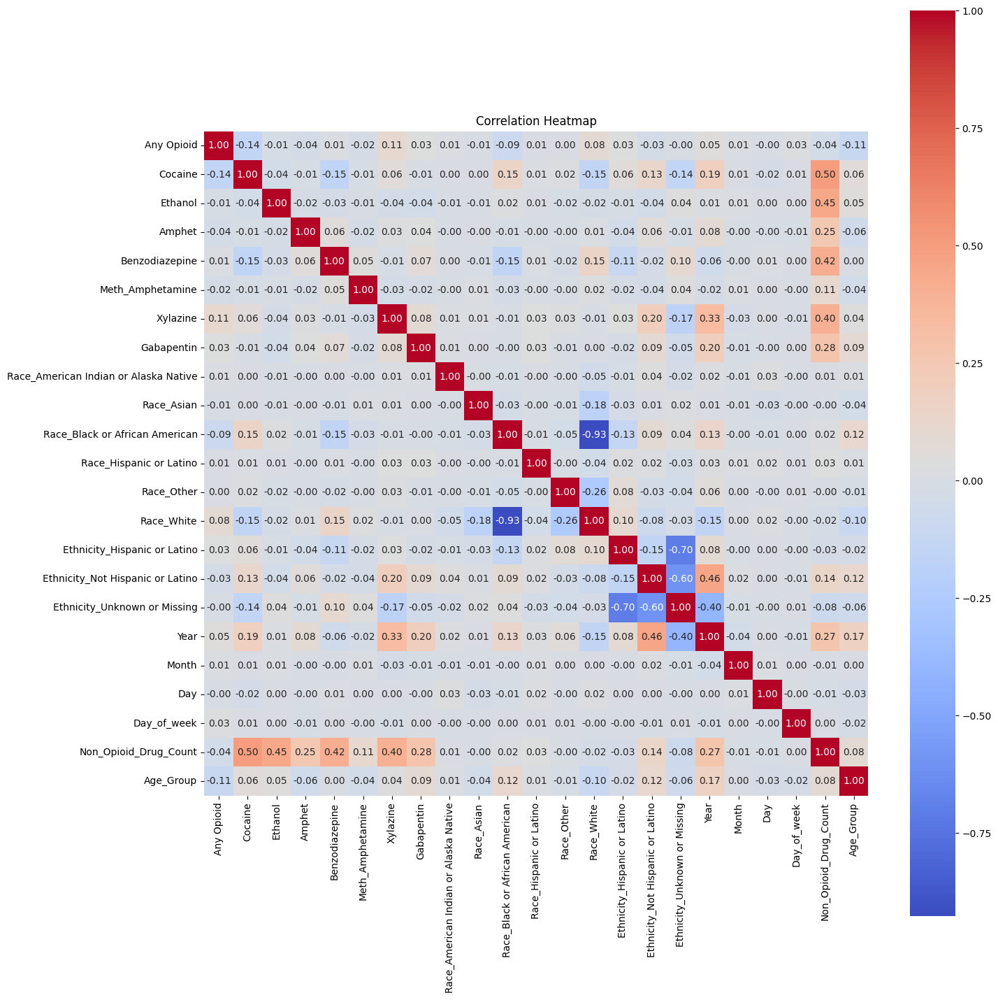

In [ ]:
# check correlation
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


numeric_cols = df.select_dtypes(include='number')


corr = numeric_cols.corr()

#  heatmap
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True)
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()



In [ ]:
df.to_csv('clean_df.csv', index=False)